#1η ατομική άσκηση


##Θεωρητικό μέρος


Διαβάστε το άρθρο [The Laplacian Pyramid as a Compact Image Code]('https://persci.mit.edu/pub_pdfs/pyramid83.pdf') των Burt, P. J. and Adelson, E. H. και απαντήστε σύντομα (1 παράγραφο) τα κάτωθι:

*α) Πώς η τιμή του α επηρεάζει την γκαουσιανή πυραμίδα;*
<br><br>
The choice of parameter α in the Laplacian pyramid determines the shape of the equivalent weighting function. When α = 0.5, the function takes on a triangular shape. For α = 0.4, it resembles a Gaussian function. As α decreases to 0.3, the function becomes broader than Gaussian. Conversely, for α = 0.6, the function exhibits a trimodal shape, reflecting multiple peaks. This variability in α allows for flexibility in adjusting the characteristics of the pyramid and consequently influences the representation of features in the image.
<br><br>
*β) Τι ορίζουμε ως εντροπία; Υπολογίστε τη μέγιστη τιμή εντροπίας που μπορεί να έχει μια grayscale εικόνα;*
<br><br>
If we assume that the pixel values of an image representation
are statistically independent, then the minimum number of bits
per pixel required to exactly encode the image is given by the entropy of the pixel value distribution. This optimum may be approached in practice through techniques such as variable length
coding.
Ιf we let the observed frequency of occurrence f(i)
of each gray level i be an estimate of its probability of
occurrence in this and other similar images, then the entropy is given by:

The maximum entropy would be 8 in this case since the
image is initially represented at 256 gray levels, and would be
obtained when all gray levels were equally likely.
<br><br>
*γ)  Πώς η επιλογή του μεγέθους του bin επηρεάζει το αποτέλεσμα του κβαντισμού;*
<br><br>
The range of pixel values is divided into bins of size n, and the quantized value Cl (i, j) for pixel Ll (i, j) is just the middle value of the bin which contains Cl(i, j) = mn if (m —1/2)n < Ll(i, j) ≤ (m + 1/2)n. Bin size becomes
smaller at higher levels (lower spatial frequencies). At a given pyramid level it reflects the sensitivity of the human observer to contrast errors within the spatial frequency bands represented at that level. Humans are fairly sensitive to contrast perturbations at low and medium spatial frequencies, but relatively insensitive to such perturbations at high spatial frequencies.
<br><br>
*δ) Εξηγήστε πώς επηρεάζεται η κβάντιση από το πλήθος των επιπέδων της πυραμίδας;*
<br><br>
Quantization is influenced by the number of levels in the pyramid. As the number of levels increases or decreases, each level contains a different level of detail, with lower levels containing more general structural information and higher levels containing finer details. Therefore, depending on the number of levels used in the pyramid, the amount of data being quantized varies. Increasing the number of levels means each level contains less information, while fewer levels result in more condensed information. This affects the discretization of data and the accuracy of image representation, with more levels offering greater detail but requiring more storage space.

##Εργαστηριακό μέρος

### Υλοποίηση Αλγορίθμου

In [1]:
import urllib.request
import cv2
import scipy.stats as st
import numpy as np
import math
from matplotlib import pyplot as plt
%matplotlib inline

####α) Συνάρτηση h = GKernel(a), η οποία θα δημιουργεί ένα Generating Kernel, εξαρτώμενο από την παράμετρο ‘a’

In [2]:
def GKernel(a):
  b = 1/4
  c = 1/4 - a/2
  w = np.array([c,b,a,b,c])
  new_w = np.reshape(w, (1, w.size))
  # create transpose w
  w_transpose = np.transpose(new_w)
  return np.matmul(w_transpose, new_w)

####β) Συνάρτηση I_out = GREDUCE(I, h)

In [22]:
def GREDUCE(I, h):
  filtered_img = cv2.filter2D(I, -1, h)
  I_reduced = filtered_img[0::2, 0::2]
  return I_reduced

#### γ) Συνάρτηση G = GPyramid(I, a, depth) όπου δέχεται ως είσοδο μία εικόνα Ι, την παράμετρο ‘a’, το επιθυμητό βάθος για την πυραμίδα ’depth’ και επιστρέφει την Gaussian pyramid και την αποθηκεύει.

In [23]:
def GPyramid(I, a, depth):
  h = GKernel(a)
  G = [I]
  for n in range(depth - 1):
    Gnext = GREDUCE(G[n], h)
    G.append(Gnext)
  return (G, h)

####δ) Συνάρτηση I_out = GEXPAND (I, h) την εξίσωση (2) (σελίδα άρθρου 534).

In [24]:
def GEXPAND(I, h):
  expanded_image = cv2.resize(I, (I.shape[0]*2, I.shape[1]*2), interpolation=cv2.INTER_AREA)
  return cv2.filter2D(expanded_image, -1, h)

####ε) Συνάρτηση L = LPyramid(I, a, depth) όπου επιστρέφει την Laplacian πυραμίδα της εικόνας I

In [25]:
def LPyramid(I, a, depth):
  (G, h) = GPyramid(I, a, depth)
  L = [G[depth - 1]]
  for n in range(depth - 1):
    interpolated = GEXPAND(G[depth - n - 1], h)
    difference = G[depth - n - 2] - interpolated + 128
    L.append(difference)
  L.reverse()
  return L

####στ) Συνάρτηση I_out = L_Pyramid_Decode(L,a) όπου λαμβάνει την Laplacian πυραμίδα L και την παράμετρο 'a' που χρησιμοποιήθηκε για τη δημιουργία της και επιστρέφει την αποκωδικοποιημένη εικόνα I_out.

In [26]:
def L_Pyramid_Decode(L, a):
  h = GKernel(a)
  depth = len(L)
  R = L[depth - 1]
  for n in range(depth - 1):
    R = GEXPAND(R, h)
    R = R + L[depth - n - 2] - 128
  return R

####ζ) Συνάρτηση κβαντισμού L_Quantization, σύμφωνα με την εξίσωση (5) (σελ. άρθρου 538).


In [21]:
def L_Quantization(image, bins_no):
  # Creates bins by dividing number of colors into given number of bins
  bins = np.linspace(0, image.max(), bins_no)
  quantized_image = np.digitize(image, bins)
  quantized_image = (np.vectorize(bins.tolist().__getitem__)
  (quantized_image-1).astype(int))
  quantized_image = np.asarray(quantized_image, dtype=np.uint8)
  return quantized_image

### Δοκιμές Αλγορίθμου

####α) Ελέγξτε τις υλοποιήσεις των συναρτήσεών σας L_Pyramid και L_Pyramid_Decode χρησιμοποιώντας τις εικόνες [Lena]("http://www.image.ntua.gr/~tpar/LABimage/lena.png") και [camera]("https://scikit-image.org/docs/dev/api/skimage.data.html#skimage.data.camera"). Πρέπει να λειτουργούν και για έγχρωμες και για grayscale εικόνες.

In [9]:
# declarations for a and depth that will be used for Testing the algorithm
a = 3/8
depth = 5

#####Εγχρωμη εικόνα (Lena)

Text(0.5, 1.0, 'Recreated image')

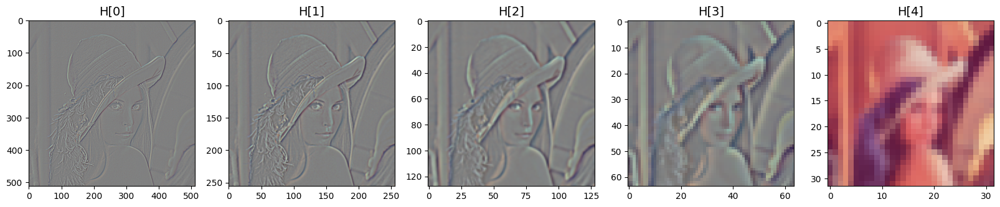

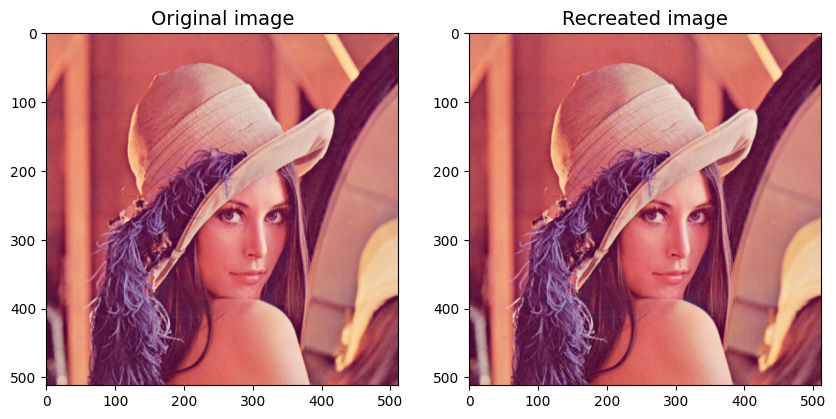

In [10]:
# get lena's image
HTTP_response = urllib.request.urlopen('http://www.image.ntua.gr/~tpar/LABimage/lena.png')
arr = np.asarray(bytearray(HTTP_response.read()), dtype=np.uint8)
BGR = cv2.imdecode(arr,-1)
lena = cv2.cvtColor(BGR, cv2.COLOR_BGR2RGB)

# Lpyramid
H = LPyramid(lena, a, depth)

f, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(1, 5, figsize=(20, 20))
ax0.imshow(H[0]) # Base of the pyramid
ax0.set_title('H[0]', fontsize=14)
ax1.imshow(H[1])
ax1.set_title('H[1]', fontsize=14)
ax2.imshow(H[2])
ax2.set_title('H[2]', fontsize=14)
ax3.imshow(H[3])
ax3.set_title('H[3]', fontsize=14)
ax4.imshow(H[4])
ax4.set_title('H[4]', fontsize=14)

# Recreate Image
recreated_image = L_Pyramid_Decode(H, a)

f, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 10))
ax0.imshow(lena)
ax0.set_title('Original image', fontsize=14)
ax1.imshow(recreated_image)
ax1.set_title('Recreated image', fontsize=14)



#####Grayscale εικόνα (camera)

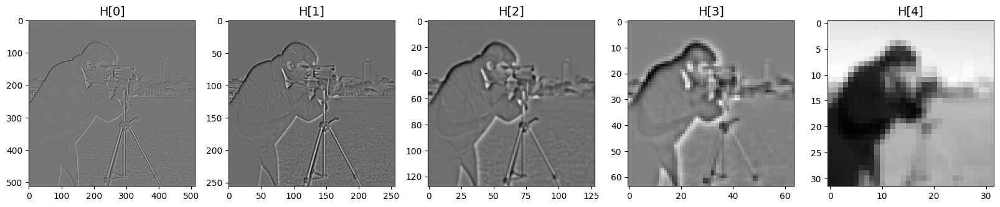

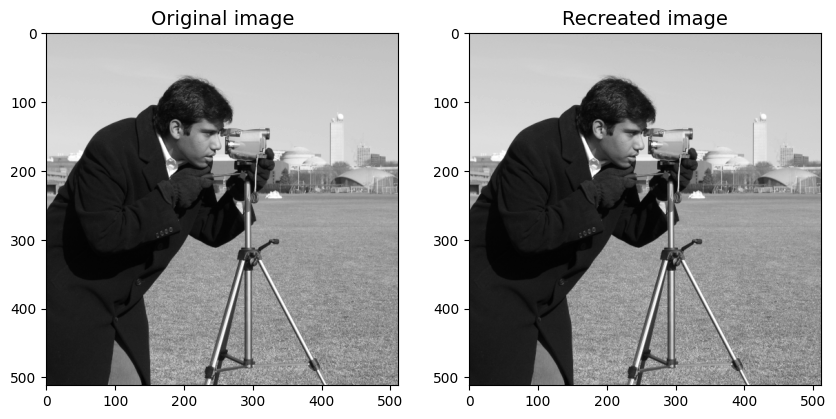

In [11]:
# get camera image
from skimage import data
camera = data.camera()

# Create Lpyramid for camera image
H = LPyramid(camera, a, depth)

f, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(1, 5, figsize=(20, 20))
ax0.imshow(H[0], cmap="gray") # Base of the pyramid
ax0.set_title('H[0]', fontsize=14)
ax1.imshow(H[1], cmap="gray")
ax1.set_title('H[1]', fontsize=14)
ax2.imshow(H[2], cmap="gray")
ax2.set_title('H[2]', fontsize=14)
ax3.imshow(H[3], cmap="gray")
ax3.set_title('H[3]', fontsize=14)
ax4.imshow(H[4], cmap="gray")
ax4.set_title('H[4]', fontsize=14)

# Recreated Image
recreated_image = L_Pyramid_Decode(H, a)

f, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 10))
ax0.set_title('Original image', fontsize=14)
ax0.imshow(camera, cmap="gray")
ax1.set_title('Recreated image', fontsize=14)
ax1.imshow(recreated_image, cmap="gray")



####β) Εμφανίστε την αρχική και την αποκωδικοποιημένη εικόνα, χρησιμοποιώντας διαφορετικά ‘a’ με τιμές να κυμαίνονται στο διάστημα [0.3,..,0.7].


#####Εγχρωμη εικόνα (Lena)

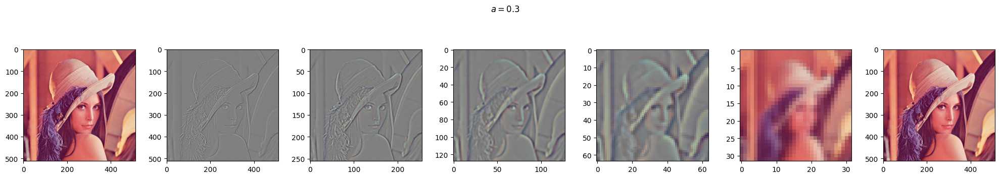

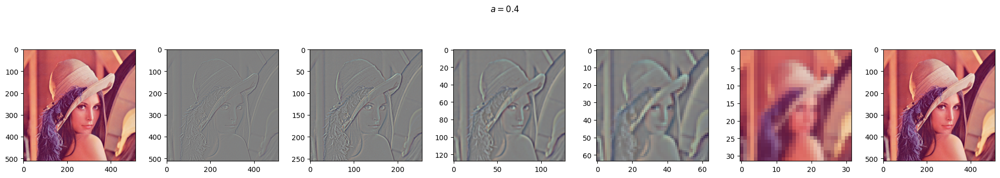

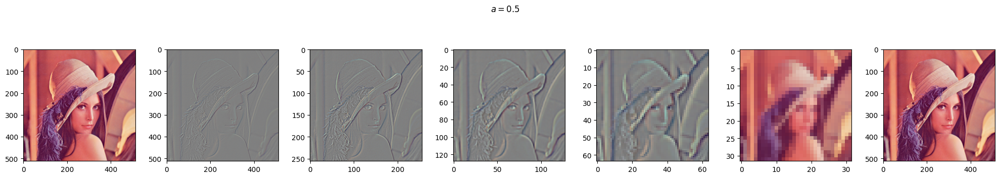

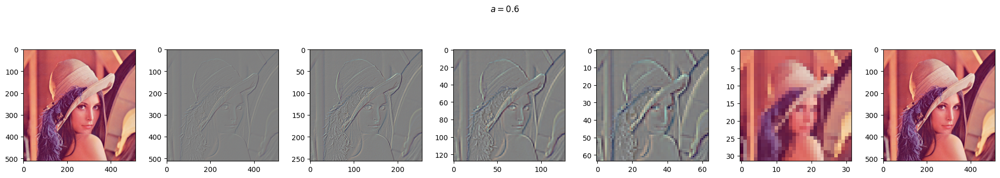

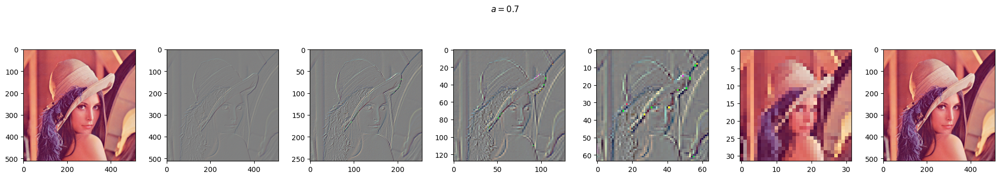

In [12]:
# iterate through list of a's, create LPyramid each time and print it
# Recreate image and also print it
for a in [0.3, 0.4, 0.5, 0.6, 0.7]:

  H = LPyramid(lena, a, depth)

  figure, axis = plt.subplots(1, len(H) + 2, figsize = (20, 4))
  figure.suptitle('$a = {}$'.format(a))
  figure.tight_layout()
  axis[0].imshow(lena)
  i = 1
  for im in H:
    axis[i].imshow(im)
    i += 1
  dec = L_Pyramid_Decode(H, a)
  axis[-1].imshow(dec)

#####Grayscale εικόνα (camera)

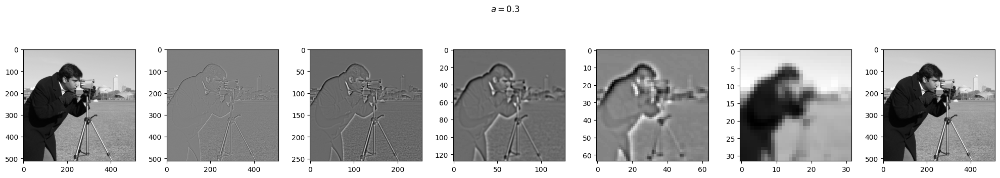

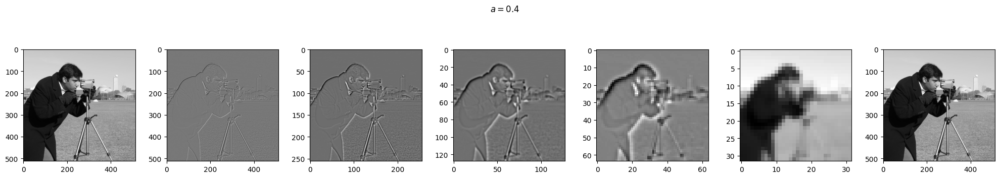

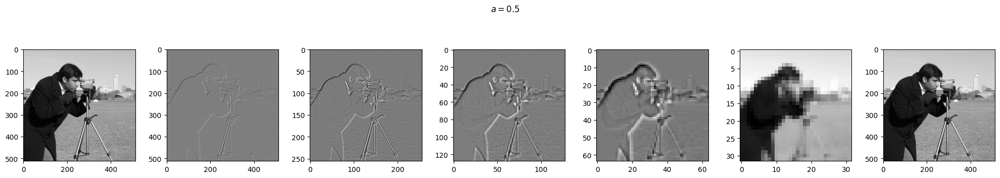

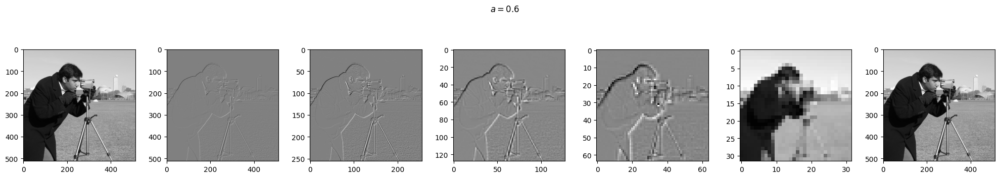

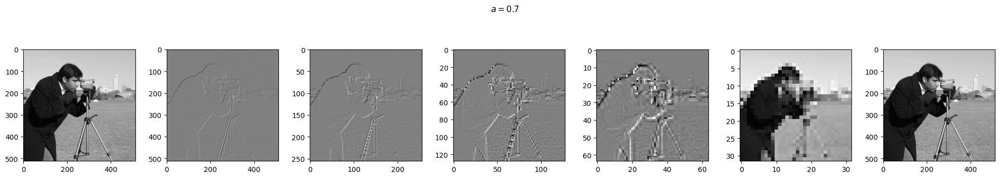

In [13]:
# iterate through list of a's, create LPyramid each time and print it
# Recreate image and also print it
for a in [0.3, 0.4, 0.5, 0.6, 0.7]:

  H = LPyramid(camera, a, depth)

  figure, axis = plt.subplots(1, len(H) + 2, figsize = (20, 4))
  figure.suptitle('$a = {}$'.format(a))
  figure.tight_layout()
  axis[0].imshow(camera, cmap="gray")
  i = 1
  for im in H:
    axis[i].imshow(im, cmap="gray")
    i += 1
  dec = L_Pyramid_Decode(H, a)
  axis[-1].imshow(dec, cmap="gray")

####γ) Εμφανίστε την αρχική και την αποκωδικοποιημένη εικόνας, χρησιμοποιώντας διαφορετικά ‘depth’ με τιμές να κυμαίνονται στο διάστημα [3,..,6].


#####Εγχρωμη εικόνα (Lena)

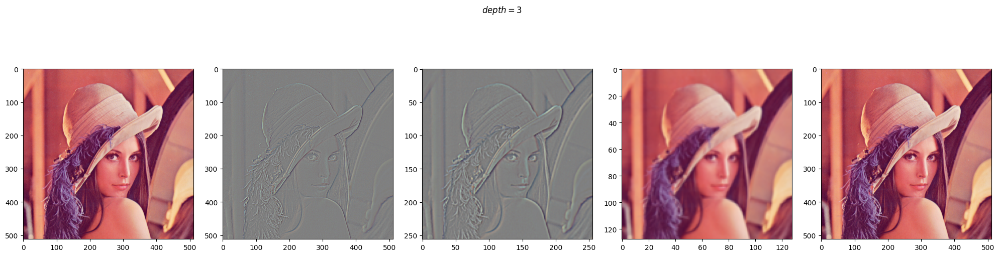

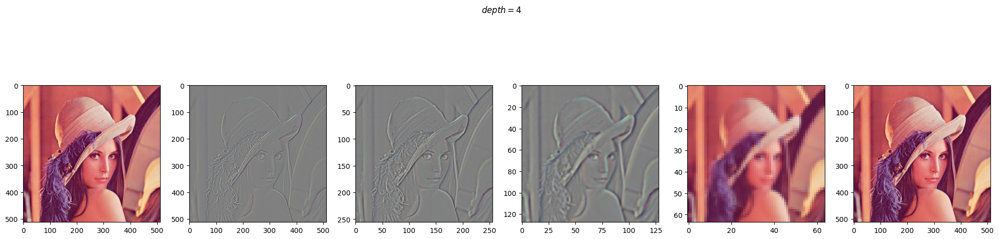

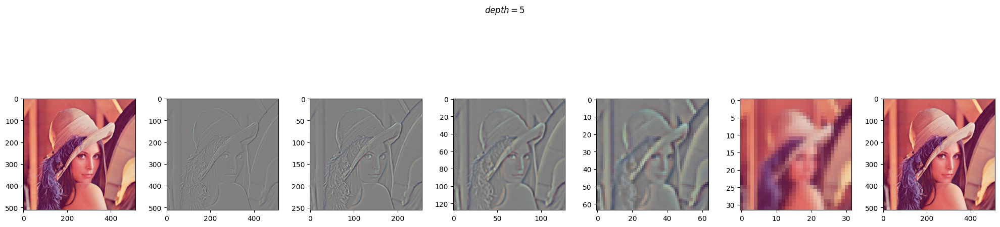

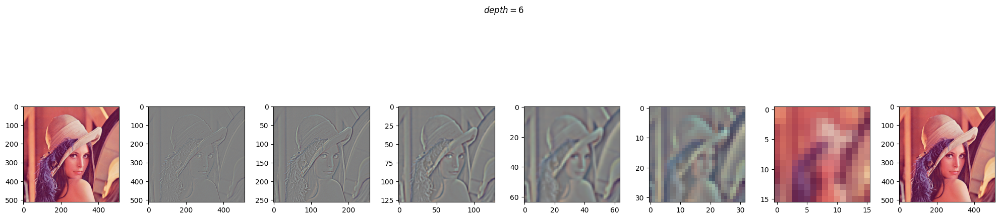

In [14]:
# iterate through list of depths's, create LPyramid each time and print it
# Recreate image and also print it

a = 3/8
for depth in [3, 4, 5, 6]:

  H = LPyramid(lena, a, depth)

  figure, axis = plt.subplots(1, len(H) + 2, figsize = (20, 6))
  figure.suptitle('$depth = {}$'.format(depth))
  figure.tight_layout()
  axis[0].imshow(lena)
  i = 1
  for im in H:
    axis[i].imshow(im)
    i += 1
  dec = L_Pyramid_Decode(H, a)
  axis[-1].imshow(dec)

#####Grayscale εικόνα (camera)

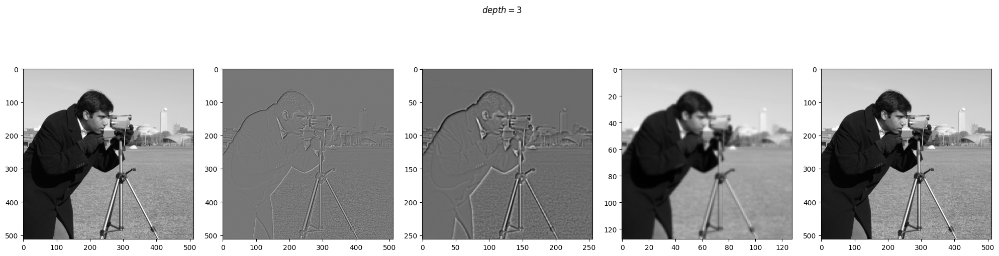

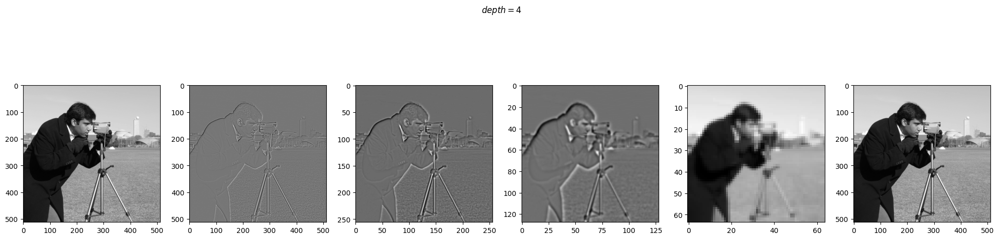

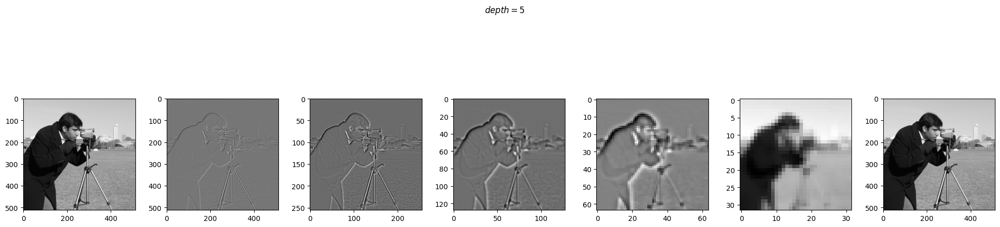

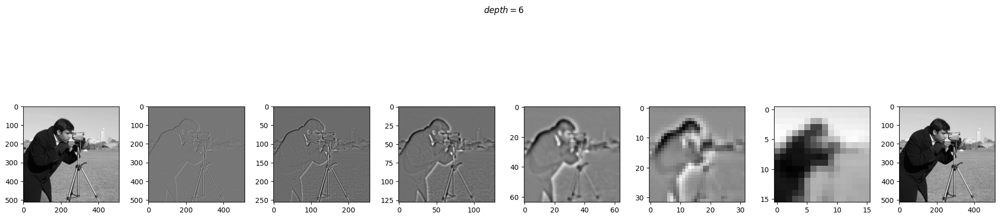

In [15]:
# iterate through list of depths's, create LPyramid each time and print it
# Recreate image and also print it

a = 3/8
for depth in [3, 4, 5, 6]:

  H = LPyramid(camera, a, depth)

  figure, axis = plt.subplots(1, len(H) + 2, figsize = (20, 6))
  figure.suptitle('$depth = {}$'.format(depth))
  figure.tight_layout()
  axis[0].imshow(camera, cmap="gray")
  i = 1
  for im in H:
    axis[i].imshow(im, cmap="gray")
    i += 1
  dec = L_Pyramid_Decode(H, a)
  axis[-1].imshow(dec, cmap="gray")

####δ) Υπολογίστε τη εντροπία και παρουσιάστε τα αντίστοιχα διαγράμματα για τα διαφορετικά ‘a’, και ‘depth’ , για κάθε εικόνα και σχολιάστε επαρκώς

#####Εγχρωμη εικόνα (Lena)

Entropy of the pyramid for a 0.3 and depth 5 =  2.8402514949632365
Entropy of the pyramid for a 0.4 and depth 5 =  2.7879196198815044
Entropy of the pyramid for a 0.5 and depth 5 =  2.746713504507115
Entropy of the pyramid for a 0.6 and depth 5 =  2.743165919572335
Entropy of the pyramid for a 0.7 and depth 5 =  2.8397757113374844


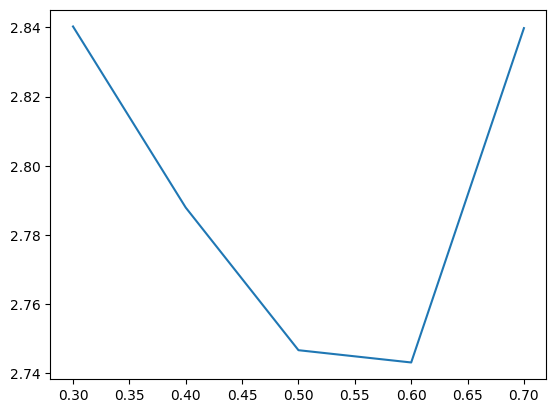

Entropy of the pyramid for a 0.375 and depth 3 =  3.173518491372588
Entropy of the pyramid for a 0.375 and depth 4 =  2.9091966146797263
Entropy of the pyramid for a 0.375 and depth 5 =  2.7971396443711236
Entropy of the pyramid for a 0.375 and depth 6 =  2.75717189471214


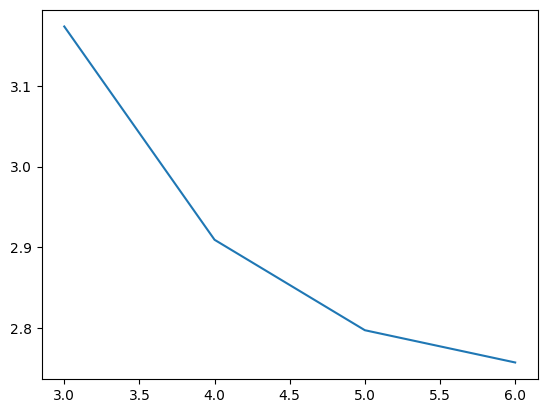

In [16]:
# for a in a's list create LPyramid, calculate histograms for every level
# combine histograms for each pyramid in order to calculate entropy
# print entropy and save every value to a list in order to use it on the next question
# print graph of entropies per a values

entropies_lena_a = []
depth = 5
a_list = [0.3, 0.4, 0.5, 0.6, 0.7]

for a in a_list:
  H = LPyramid(lena, a, depth)
  sum_hist = np.zeros([256, 1], np.float64)
  for n in H:
    hist = cv2.calcHist(n, [0], None, [256], [0, 256])
    sum_hist += hist
  entropy = st.entropy(sum_hist)[0]

  print("Entropy of the pyramid for a " + str(a) +" and depth " + str(depth) + " = ", entropy)
  entropies_lena_a.append(entropy)

plt.plot(a_list, entropies_lena_a)
plt.show()

# same operations as above, but with different depths and a = 3/8
entropies_lena_depth = []
a = 3/8
depth_list = [3, 4, 5, 6]

for d in depth_list:
  H = LPyramid(lena, a, d)
  sum_hist = np.zeros([256, 1], np.float64)
  for n in H:
    hist = cv2.calcHist(n, [0], None, [256], [0, 256])
    sum_hist += hist
  entropy = st.entropy(sum_hist)[0]

  print("Entropy of the pyramid for a " + str(a) + " and depth " + str(d) + " = ", entropy)
  entropies_lena_depth.append(entropy)

plt.plot(depth_list, entropies_lena_depth)
plt.show()


#####Grayscale εικόνα (camera)

Entropy of the pyramid for a 0.3 and depth 5 =  1.021562722021159
Entropy of the pyramid for a 0.4 and depth 5 =  0.9601321084144705
Entropy of the pyramid for a 0.5 and depth 5 =  0.9083412896407038
Entropy of the pyramid for a 0.6 and depth 5 =  0.9082863793517849
Entropy of the pyramid for a 0.7 and depth 5 =  0.9778730928198406


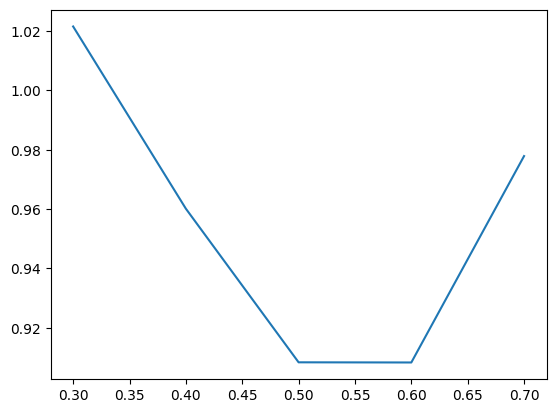

Entropy of the pyramid for a 0.375 and depth 3 =  1.404720732147643
Entropy of the pyramid for a 0.375 and depth 4 =  1.1027809855170458
Entropy of the pyramid for a 0.375 and depth 5 =  0.9694813711299999
Entropy of the pyramid for a 0.375 and depth 6 =  0.9626537650433541


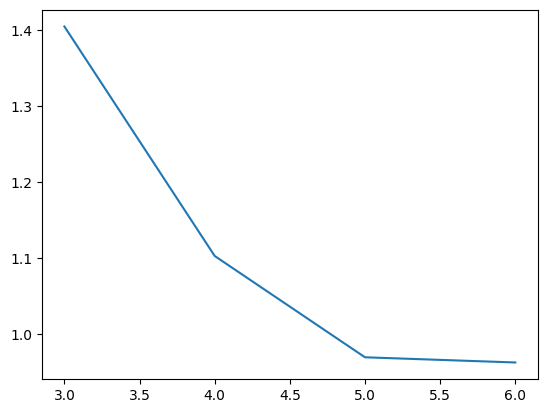

In [17]:
# for a in a's list create LPyramid, calculate histograms for every level
# combine histograms for each pyramid in order to calculate entropy
# print entropy and save every value to a list in order to use it on the next question
# print graph of entropies per a values

entropies_camera_a = []
depth = 5
a_list = [0.3, 0.4, 0.5, 0.6, 0.7]

for a in a_list:
  H = LPyramid(camera, a, depth)
  sum_hist = np.zeros([256, 1], np.float64)
  for n in H:
    hist = cv2.calcHist(n, [0], None, [256], [0, 256])
    sum_hist += hist
  entropy = st.entropy(sum_hist)[0]

  print("Entropy of the pyramid for a " + str(a) + " and depth " + str(depth) + " = ", entropy)
  entropies_camera_a.append(entropy)

plt.plot(a_list, entropies_camera_a)
plt.show()

# same operations as above, but with different depths and a = 3/8
entropies_camera_depth = []
a = 3/8
depth_list = [3, 4, 5, 6]

for d in depth_list:
  H = LPyramid(camera, a, d)
  sum_hist = np.zeros([256, 1], np.float64)
  for n in H:
    hist = cv2.calcHist(n, [0], None, [256], [0, 256])
    sum_hist += hist
  entropy = st.entropy(sum_hist)[0]

  print("Entropy of the pyramid for a " + str(a) + " and depth " + str(d) + " = ", entropy)
  entropies_camera_depth.append(entropy)

plt.plot(depth_list, entropies_camera_depth)
plt.show()

####ε) Εντοπίστε το βέλτιστο ‘a’, χρησιμοποιώντας την εντροπία και τη διακύμανση των τιμών των εικονοστοιχείων σε κάθε επίπεδο της πυραμίδας Laplacian, για κάθε εικόνα.


In [18]:
# Find a value for minimum entropy for each image and save it respectively to a variable
a_opt_lena = a_list[entropies_lena_a.index(min(entropies_lena_a))]
print('Optimal \'a\' value for coloured image(Lena) with a given depth of ',depth,':', a_opt_lena)

a_opt_camera = a_list[entropies_camera_a.index(min(entropies_camera_a))]
print('Optimal \'a\' value for grayscale image(Camera) with a given depth of ',depth,':', a_opt_camera)

Optimal 'a' value for coloured image(Lena) with a given depth of  5 : 0.6
Optimal 'a' value for grayscale image(Camera) with a given depth of  5 : 0.6


* Για την έγχρωμη είκονα (Lena)<br>
Για δεδομένο depth = 5 όπως υπολογίστηκε πιο πανω προκύπτει ότι το βέλτιστο a είναι 0.6 διότι από αυτό προκύπτει η ελάχιστη τιμή εντροπίας επομένως με αυτή την τιμή μπορεί να επιτευχθεί
<br>
<br>
* Για την grayscale είκονα (Camera)<br>
Για δεδομένο depth = 5 όπως υπολογίστηκε πιο πανω προκύπτει ότι το βέλτιστο a είναι 0.5 διότι από αυτό προκύπτει η ελάχιστη τιμή εντροπίας επομένως με αυτή την τιμή μπορεί να επιτευχθεί

####στ) Για το βέλτιστο ‘a’ που υπολογίσατε στο προηγούμενο ερώτημα, κβαντίστε τις εικόνες Lena και camera χρησιμοποιώντας διαφορετικά bin size (πραγματοποιήστε 3 διαφορετικά πειράματα για κάθε εικόνα)

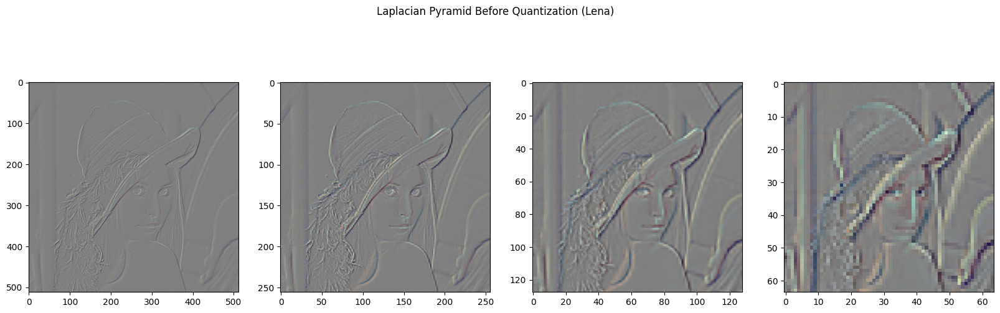

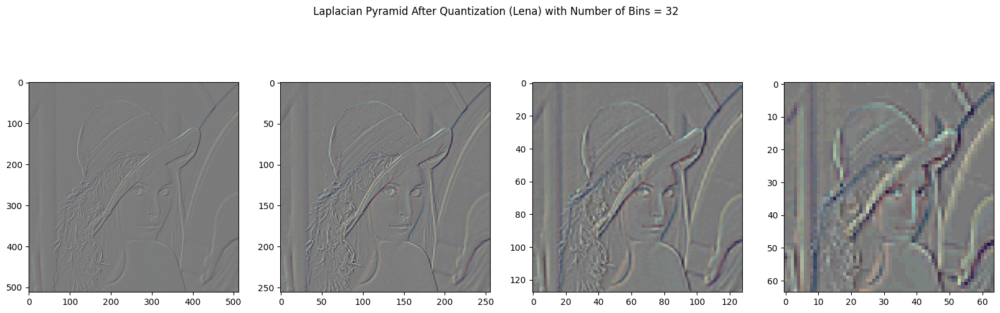

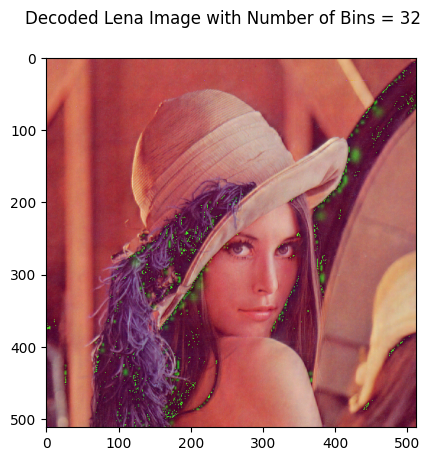

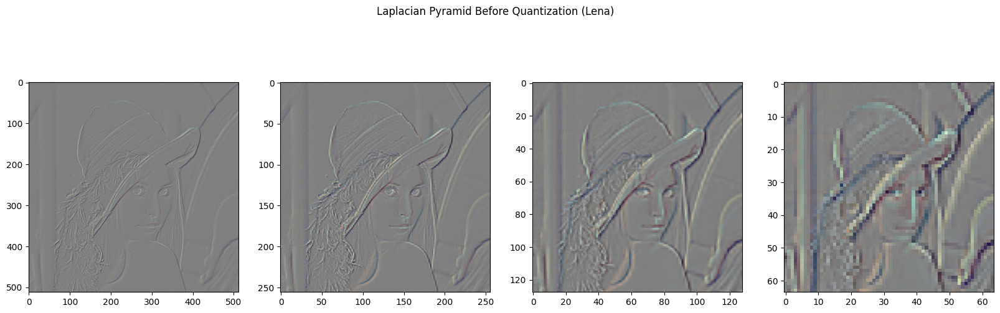

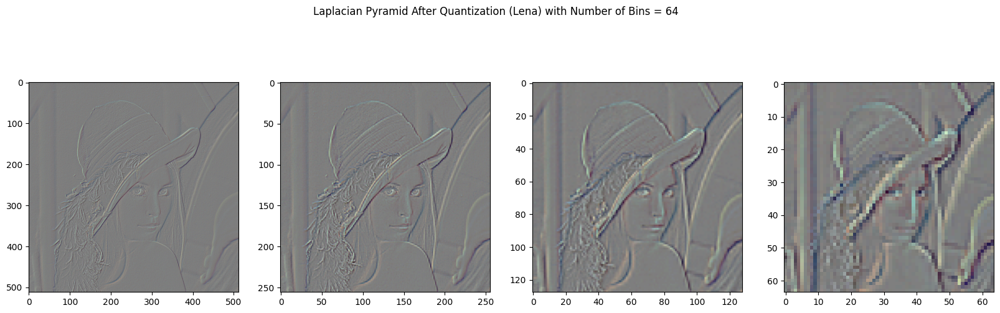

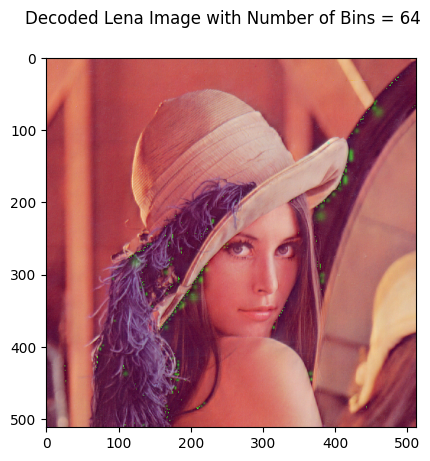

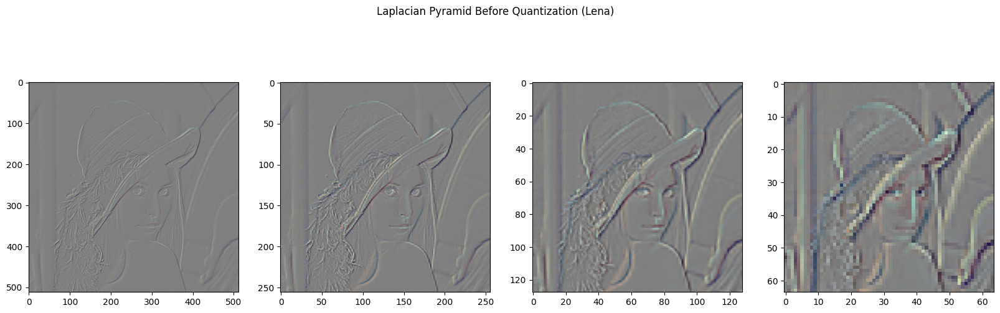

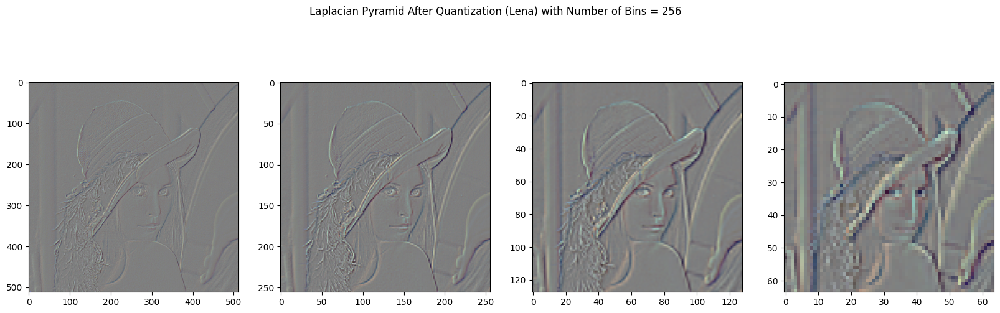

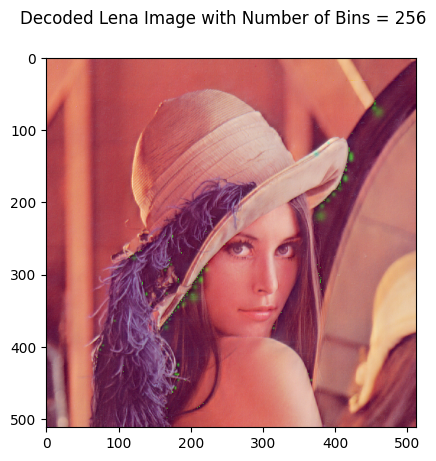

In [19]:
# bins number list that will be used in these 3 different experiments
bins_no_list = [32, 64, 256]

lena_dec_images = []

# iterate through the bins_no_list create the Lpyramid and print it
# Quantize all images in L pyramid apart from the last one(L[depth]) with the given number
# of bins and print the Quantized Lpyramid. Then recreate the image using the Quantized LPyramid
for bins_no in bins_no_list:
  L_pyramid_lena = LPyramid(lena, a_opt_lena, depth)
  figure_before, axis_before = plt.subplots(1, len(L_pyramid_lena) - 1, figsize = (20, 6))
  figure_after, axis_after = plt.subplots(1, len(L_pyramid_lena) - 1, figsize = (20, 6))

  figure_before.suptitle('Laplacian Pyramid Before Quantization (Lena)')
  figure_after.suptitle('Laplacian Pyramid After Quantization (Lena) with Number of Bins = {}'.format(bins_no))

  for i in range (len(L_pyramid_lena) - 1):
    axis_before[i].imshow(L_pyramid_lena[i])
    L_pyramid_lena[i] = L_Quantization(L_pyramid_lena[i], bins_no)
    axis_after[i].imshow(L_pyramid_lena[i])

  dec_image_lena = L_Pyramid_Decode(L_pyramid_lena, a)
  fig = plt.figure()
  fig.suptitle('Decoded Lena Image with Number of Bins = {}'.format(bins_no))
  lena_dec_images.append(dec_image_lena)
  plt.imshow(dec_image_lena)

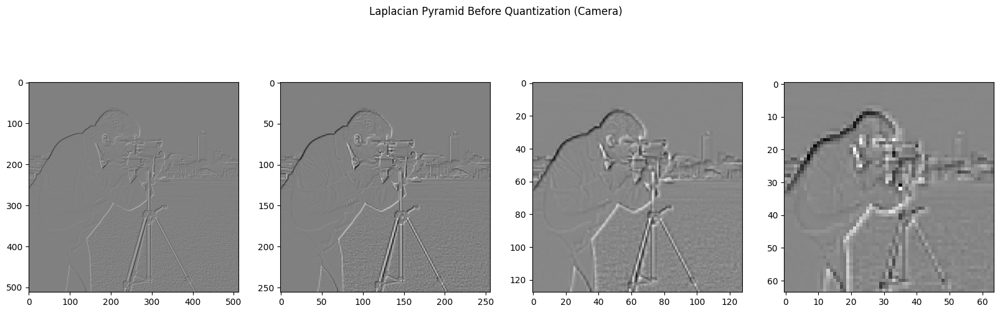

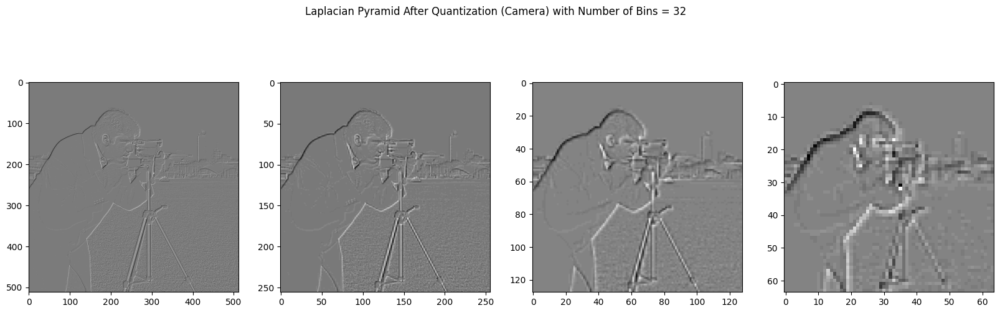

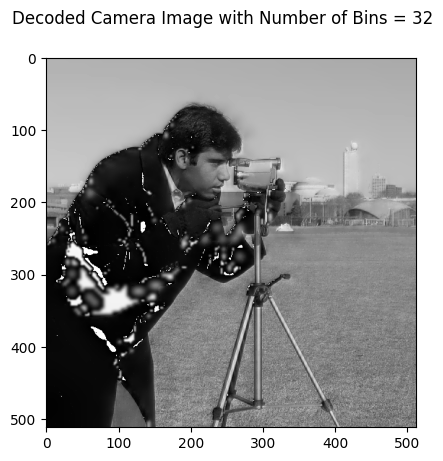

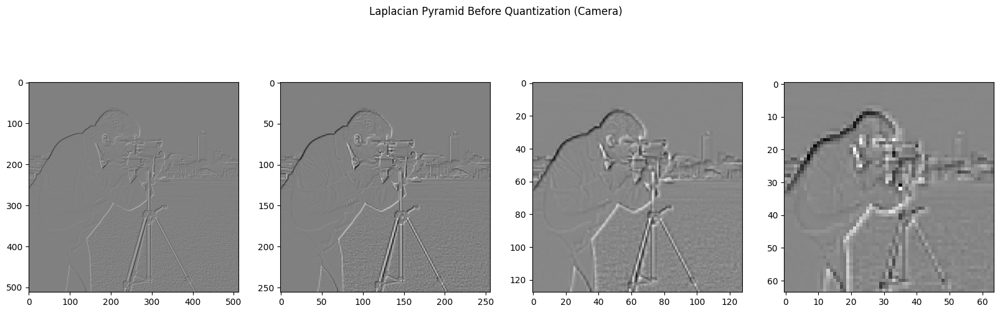

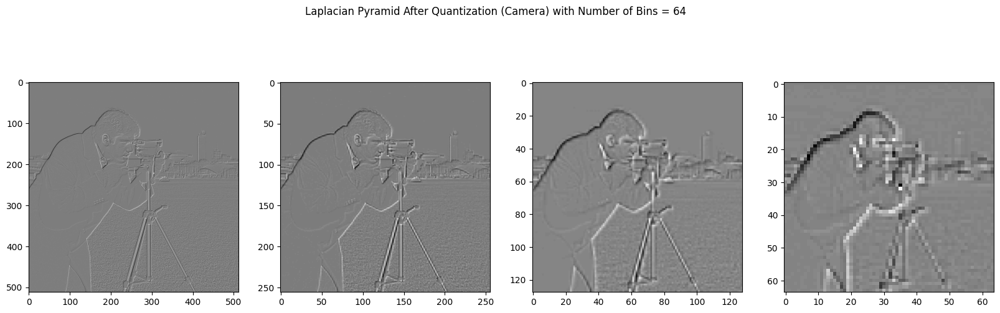

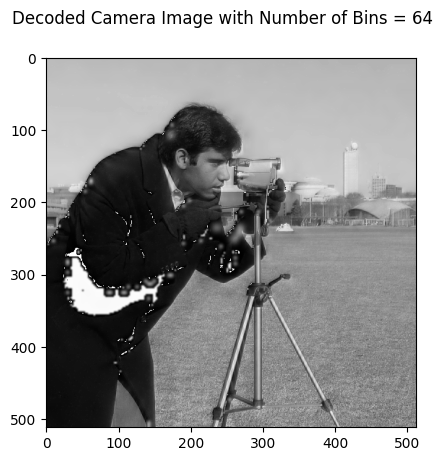

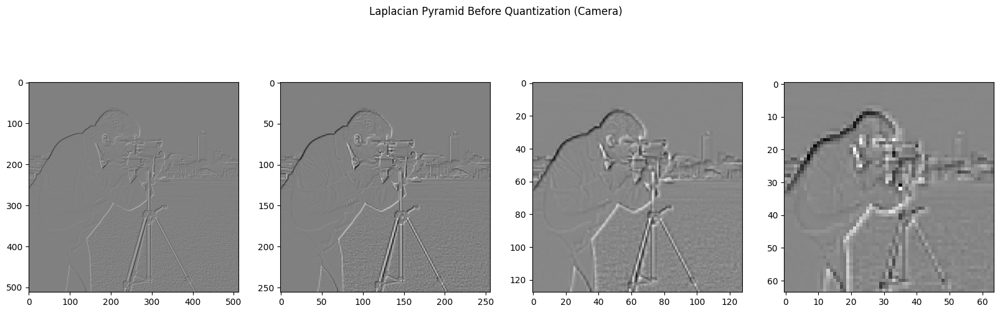

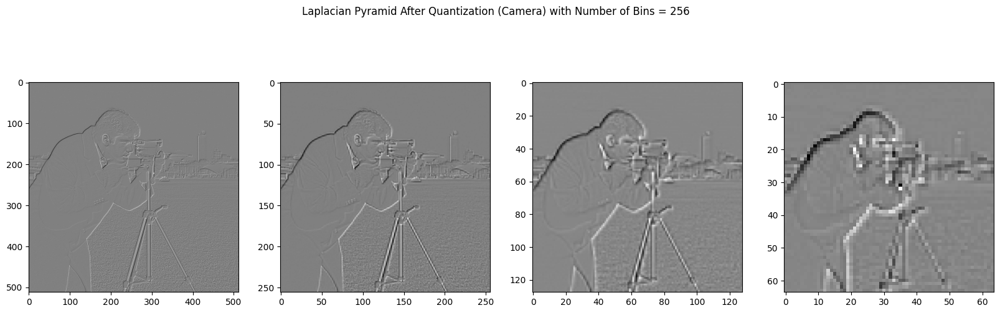

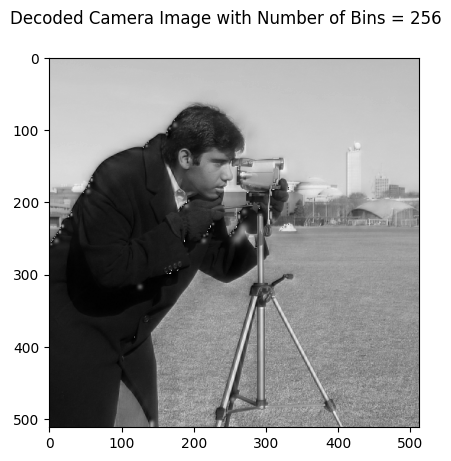

In [20]:
camera_dec_images = []

# iterate through the bins_no_list create the Lpyramid and print it
# Quantize all images in L pyramid apart from the last one(L[depth]) with the given number
# of bins and print the Quantized Lpyramid. Then recreate the image using the Quantized LPyramid
for bins_no in bins_no_list:
  L_pyramid_camera = LPyramid(camera, a_opt_camera, depth)
  figure_before, axis_before = plt.subplots(1, len(L_pyramid_camera) - 1, figsize = (20, 6))
  figure_after, axis_after = plt.subplots(1, len(L_pyramid_camera) - 1, figsize = (20, 6))

  figure_before.suptitle('Laplacian Pyramid Before Quantization (Camera)')
  figure_after.suptitle('Laplacian Pyramid After Quantization (Camera) with Number of Bins = {}'.format(bins_no))

  for i in range (len(L_pyramid_camera) - 1):
    axis_before[i].imshow(L_pyramid_camera[i], cmap="gray")
    L_pyramid_camera[i] = L_Quantization(L_pyramid_camera[i], bins_no)
    axis_after[i].imshow(L_pyramid_camera[i], cmap="gray")

  dec_image_camera = L_Pyramid_Decode(L_pyramid_camera, a)
  fig = plt.figure()
  fig.suptitle('Decoded Camera Image with Number of Bins = {}'.format(bins_no))
  camera_dec_images.append(dec_image_camera)
  plt.imshow(dec_image_camera, cmap="gray")